In [338]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering


In [339]:
# Read in the images pairs into a list of tuples
DATA_DIR = "hw6data"

img_paths = os.listdir(DATA_DIR)
image_pairs = []
color_image_pairs = []

for i in range(0, len(img_paths)-1, 2):
    fname_i, fname_j = img_paths[i], img_paths[i+1]

    # Read in Grayscale images for processing
    img_i = cv2.imread(os.path.join(DATA_DIR, fname_i), cv2.IMREAD_GRAYSCALE)
    img_j = cv2.imread(os.path.join(DATA_DIR, fname_j), cv2.IMREAD_GRAYSCALE)
    image_pairs.append((img_i, img_j))

    # Read in color images for display
    img_i = cv2.imread(os.path.join(DATA_DIR, fname_i), cv2.IMREAD_COLOR)
    img_j = cv2.imread(os.path.join(DATA_DIR, fname_j), cv2.IMREAD_COLOR)
    color_image_pairs.append((img_i, img_j))


In [340]:
# Find Keypoints and motion vectors
paired_keypoints = []
motion_vectors = []
detector_params = {"maxCorners":500, "qualityLevel":.01, "minDistance":1.0}

for img_i, img_j in image_pairs:
    pts_i = cv2.goodFeaturesToTrack(img_i, **detector_params)
    pts_j, status, _ = cv2.calcOpticalFlowPyrLK(img_i, img_j, pts_i, None)

    # Select good points
    good_pts_i = pts_i[status == 1]
    good_pts_j = pts_j[status == 1]

    paired_keypoints.append((good_pts_i, good_pts_j))
    motion_vectors.append(good_pts_j - good_pts_i)

In [341]:
"""
Estimating FOEs
"""
NUM_SAMPLES = 400   
DIST_THRESH = 10 

FOE_pts = []

for img_idx in range(len(image_pairs)):
    num_pts = len(paired_keypoints[img_idx][0])
    sampling_indices = np.random.choice(num_pts, (NUM_SAMPLES, 2))
    
    # Precompute the lines in implicit form 
    src_pts = paired_keypoints[img_idx][0][sampling_indices.ravel()]
    end_pts = paired_keypoints[img_idx][1][sampling_indices.ravel()]

    # Compute Normalized coefficients for the line in implicit form (ax + by + c = 0)
    a = -(end_pts[:, 1] - src_pts[:, 1])
    b = end_pts[:, 0] - src_pts[:, 0]
    c = src_pts[:, 0] * end_pts[:, 1] - end_pts[:, 0] * src_pts[:, 1]
    norm_factors = np.sqrt(a**2 + b**2)
    a_norm, b_norm, c_norm = a / norm_factors, b / norm_factors, c / norm_factors

    # Stack normalized coefficients into a single NumPy array
    lines = np.stack((a_norm, b_norm, c_norm), axis=-1)

    # Loop over images
    max_p = None
    max_num_lines = 0

    # Loop over interest points i, j
    for i, j in sampling_indices:
        if i == j: continue

        A = np.vstack([lines[i], lines[j]])
        _, _, Vh = np.linalg.svd(A, full_matrices=True)
        cand_foe_pt = Vh[-1]
        cand_foe_pt /= cand_foe_pt[-1]

        # Count how many lines are near this candiate foe point
        distances = np.abs(np.dot(lines, cand_foe_pt))
        num_lines_close = np.sum(distances < DIST_THRESH)

        if num_lines_close > max_num_lines:
            max_num_lines = num_lines_close
            max_p = cand_foe_pt[:2]
        
    FOE_pts.append((int(max_p[0]), int(max_p[1])))


In [346]:
# Calculate the angle between two vectors
def calculate_vector_angle(v1, v2):
    unit_v1 = v1 / np.linalg.norm(v1)
    unit_v2 = v2 / np.linalg.norm(v2)
    dot_product = np.dot(unit_v1, unit_v2)
    angle = np.arccos(dot_product)
    
    return np.degrees(angle)


# Determine is the camera is moving in each image
angle_threshold = 30
percent_aligned_threshold = 50

camera_moving_mask = []
alignment_percentages = []

for idx, ((kps_i, kps_j), foe) in enumerate(zip(paired_keypoints, FOE_pts)):
    vectors = motion_vectors[idx]
    foe = FOE_pts[idx]
    directions_from_foe = kps_i - foe
    
    angles = []

    # Calculate angles between the direction from FOE and motion vectors
    for i in range(len(vectors)):
        angle = calculate_vector_angle(directions_from_foe[i], vectors[i])
        angles.append(angle)

    # Determine the percentage of vectors aligned with the FOE direction
    aligned_vectors = [angle for angle in angles if angle <= angle_threshold or angle >= 180 - angle_threshold]
    percentage_aligned = len(aligned_vectors) / len(angles) * 100

    # Criterion for movement: significant percentage aligned with FOE
    is_moving = percentage_aligned > percent_aligned_threshold  
    camera_moving_mask.append(is_moving)
    alignment_percentages.append(percentage_aligned)


C:\Users\jesse\AppData\Local\Temp\ipykernel_19580\3048564289.py:6: RuntimeWarning: invalid value encountered in arccos
  angle = np.arccos(dot_product)


In [343]:
from sklearn.discriminant_analysis import StandardScaler

magnitude_threshold = 1.20  # 20% greater than the global average
object_labels = []

for pair_idx in range(len(image_pairs)):
    pts = paired_keypoints[pair_idx]
    vectors = motion_vectors[pair_idx]
    kps_i = paired_keypoints[pair_idx][0].astype(np.int32)
    kps_j = paired_keypoints[pair_idx][1].astype(np.int32)

    avg_global_vector = np.median(vectors, axis=0)
    global_avg_magnitude = np.linalg.norm(avg_global_vector)

    cluster = AgglomerativeClustering(n_clusters=None, distance_threshold=5.0, linkage='ward')
    scaler = StandardScaler()

    data = np.hstack((kps_i, vectors))
    # Normalize the data to account for scaling differences between vectors and points
    data = scaler.fit_transform(data)

    labels = cluster.fit_predict(data)
    unique_labels = np.unique(labels)

    # Calculate average vector magnitude for each cluster
    new_labels = labels.copy()
    for label in unique_labels:
        cluster_indices = labels == label
        cluster_vectors = vectors[cluster_indices]
        avg_cluster_vector = np.mean(cluster_vectors, axis=0)
        avg_magnitude = np.linalg.norm(avg_cluster_vector)

        # Compare to global average and filter
        if np.abs(avg_magnitude - global_avg_magnitude) <= global_avg_magnitude * magnitude_threshold:
            new_labels[cluster_indices] = 0  # Reset label to 0 for non-independent motions

    object_labels.append(new_labels)


In [354]:
from matplotlib.patches import Rectangle

def draw_motion_vec_and_foe(image, pair_idx, kps_i, kps_j):
    # Draw motion vectors
    for _, (src_pt, end_pt) in enumerate(zip(kps_i, kps_j)):
        cv2.circle(image, tuple(src_pt), 3, (0, 0, 255),-1)
        cv2.arrowedLine(image, tuple(src_pt), tuple(end_pt), (0, 255, 0), 2)

    # Plot FOE
    is_moving = camera_moving_mask[pair_idx]
    if is_moving:
        cv2.circle(image, tuple(FOE_pt), 8, (255, 0, 255), -1)

    # Diagnostic output
    if not is_moving:
        print(f"No FOE plotted since percentage of vectors aligned with FOE
              ({alignment_percentages[pair_idx]:.3f}%) falls below threshhold")

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying correctly
    plt.title('Motion Vectors (the camera ' + ('IS' if is_moving else "is NOT") + " moving)" )
    plt.axis('off') 
    plt.show()


def draw_clusters(image, labels, pts):
    def get_unique_colors(n):
        colors = plt.cm.get_cmap('hsv', n)
        return [colors(i) for i in range(n)]

    unique_labels = np.unique(labels)
    colors = get_unique_colors(len(unique_labels))

    _, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Display the image

    # Loop through each label to plot and draw bounding boxes
    for i, label in enumerate(unique_labels):
        if i == 0: continue
        label_points = pts[labels == label]
        
        ax.scatter(label_points[:, 0], label_points[:, 1], s=2, color=colors[i][:3], label=f'Object {label}')
        
        # Compute the bounding box
        min_x, min_y = np.min(label_points, axis=0)
        max_x, max_y = np.max(label_points, axis=0)
        width, height = max_x - min_x, max_y - min_y
        
        rect = Rectangle((min_x, min_y), width, height, linewidth=1, edgecolor=colors[i][:3], facecolor='none')
        ax.add_patch(rect)

    plt.title('Detected Moving Objects')
    plt.axis('off')
    plt.show()

SyntaxError: unterminated string literal (detected at line 16) (1397165793.py, line 16)

Image Pair #1:


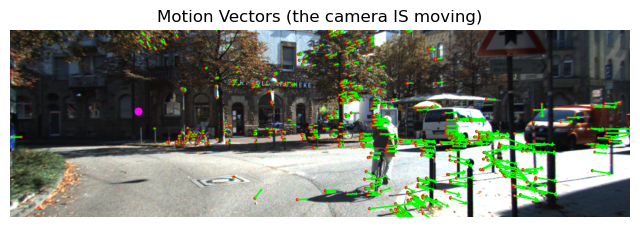

C:\Users\jesse\AppData\Local\Temp\ipykernel_19580\2453960612.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('hsv', n)


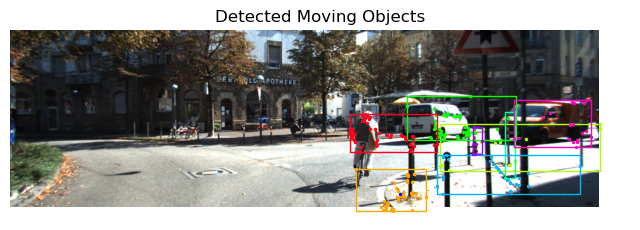

Image Pair #2:


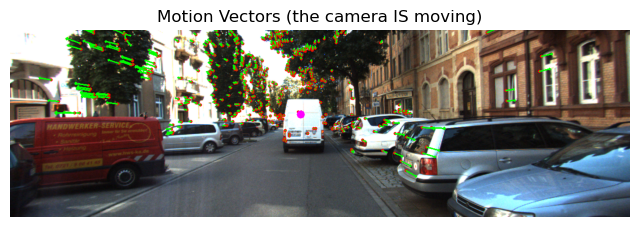

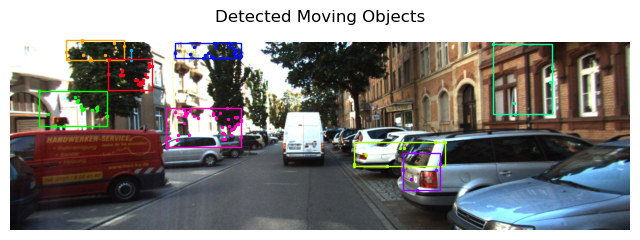

Image Pair #3:
No FOE plotted since percentage of vectors aligned (43.611%) falls below threshhold


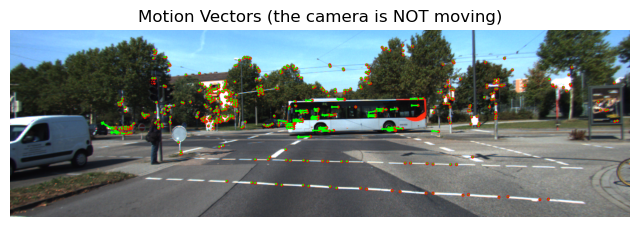

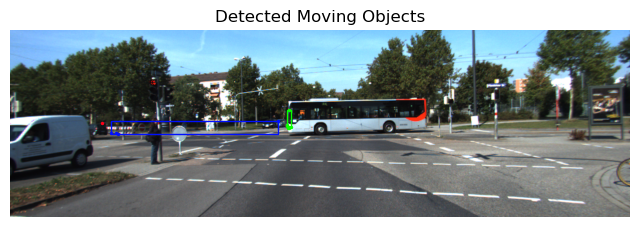

Image Pair #4:


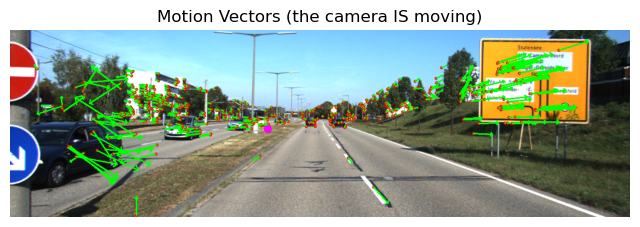

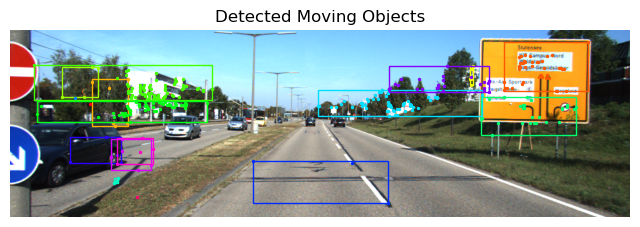

Image Pair #5:


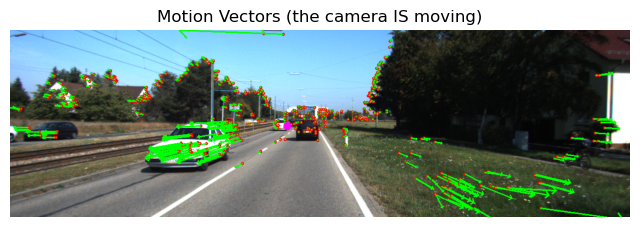

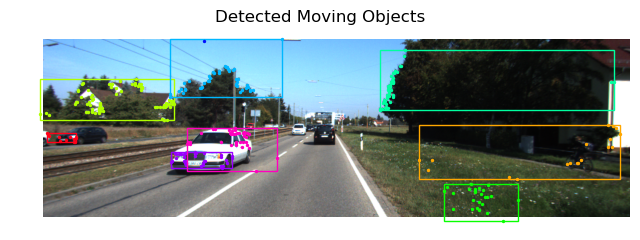

Image Pair #6:


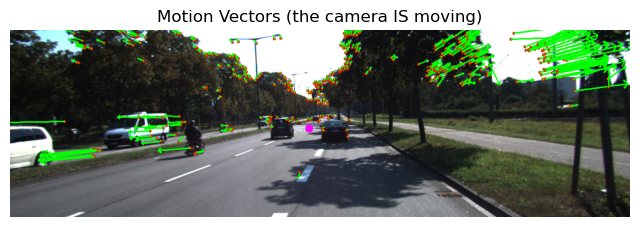

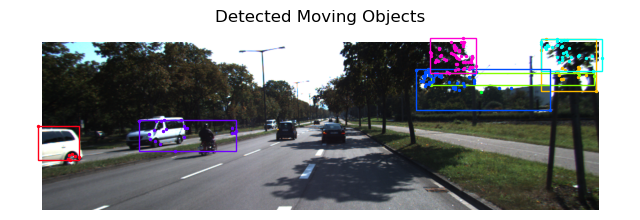

Image Pair #7:


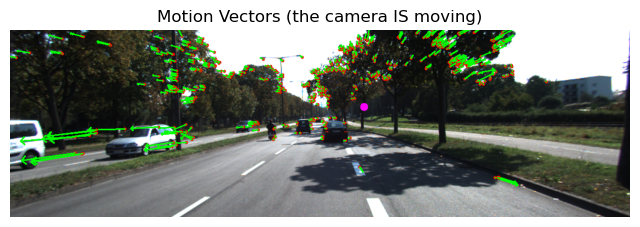

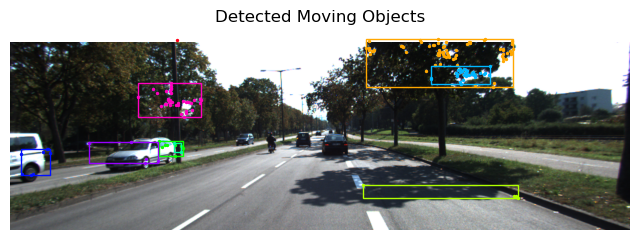

Image Pair #8:


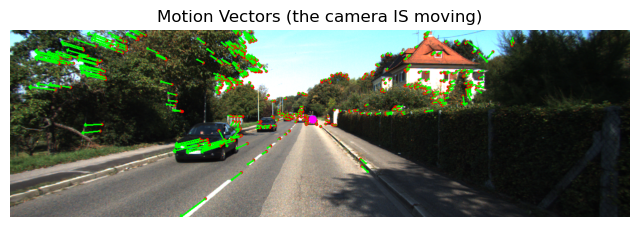

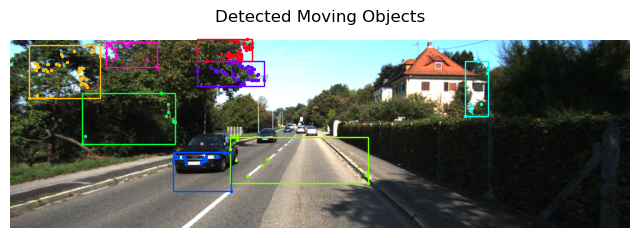

Image Pair #9:


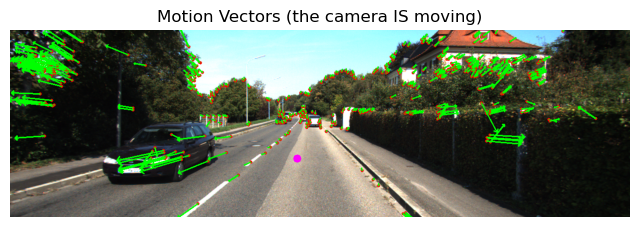

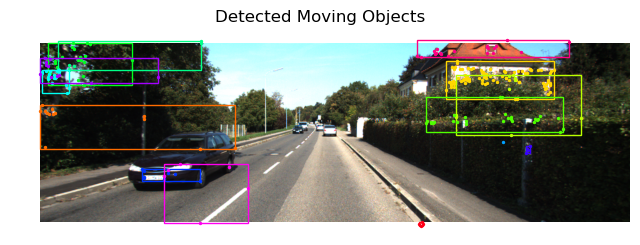

Image Pair #10:


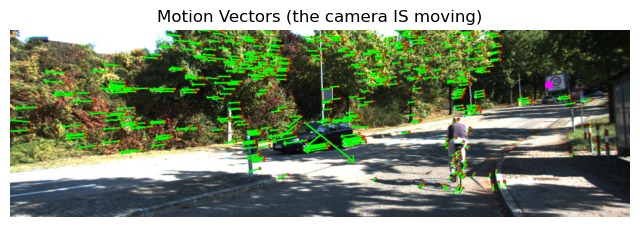

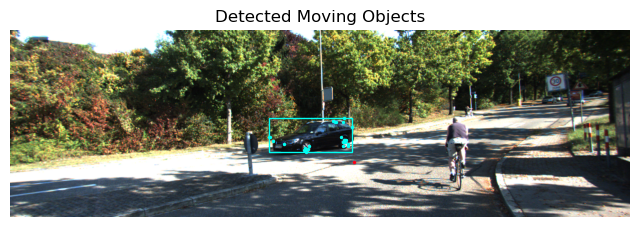

Image Pair #11:


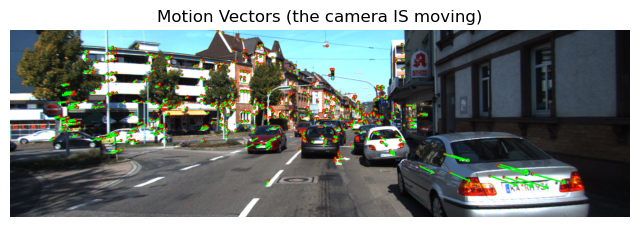

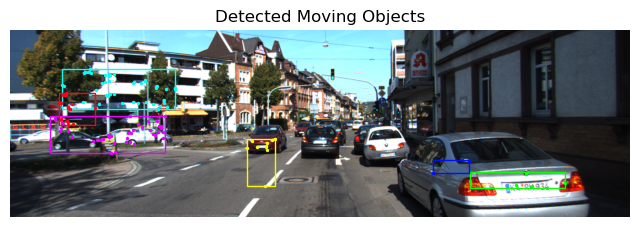

Image Pair #12:


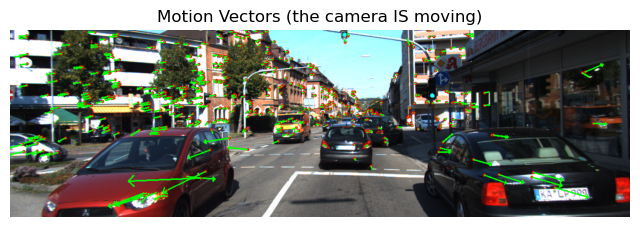

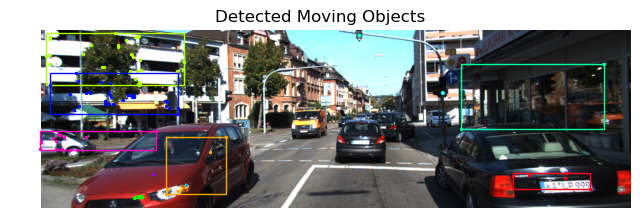

Image Pair #13:


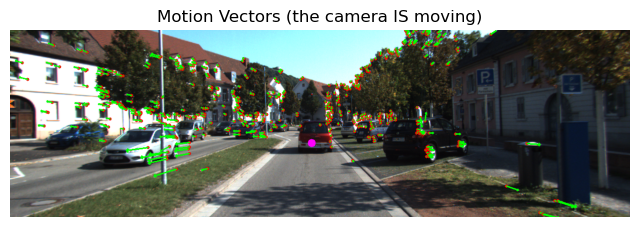

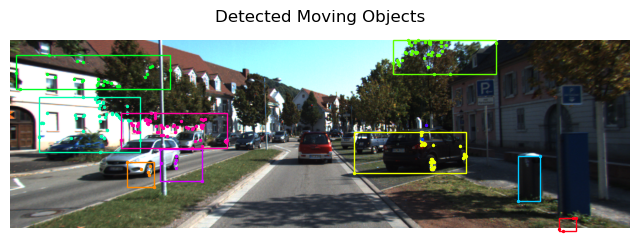

Image Pair #14:
No FOE plotted since percentage of vectors aligned (41.200%) falls below threshhold


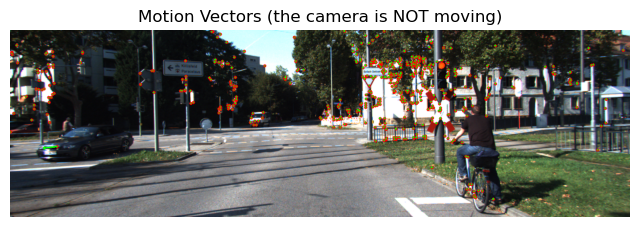

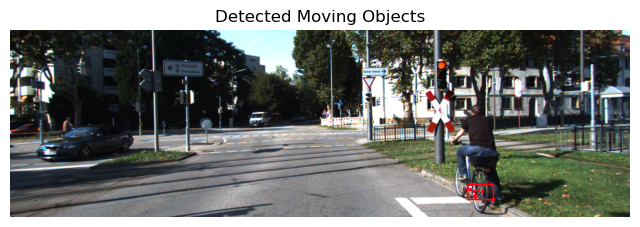

Image Pair #15:
No FOE plotted since percentage of vectors aligned (36.620%) falls below threshhold


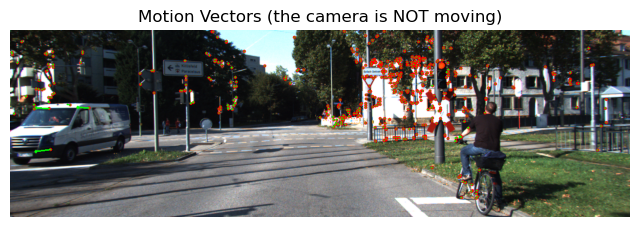

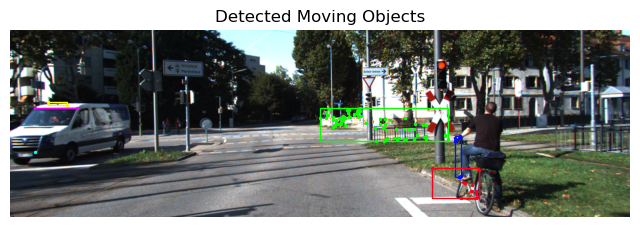

Image Pair #16:


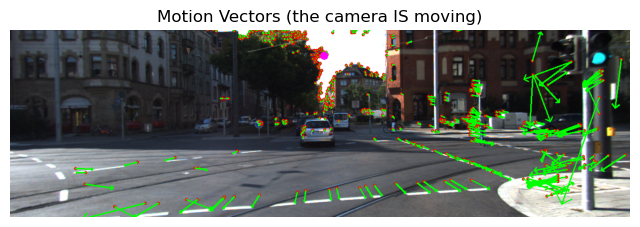

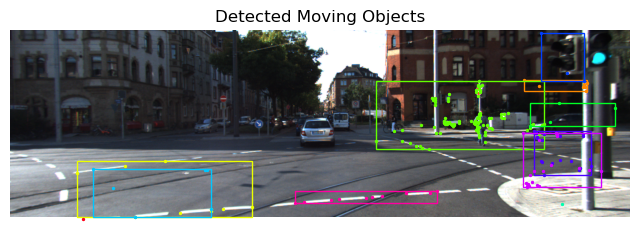

Image Pair #17:


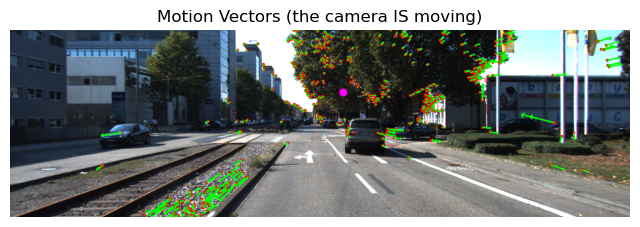

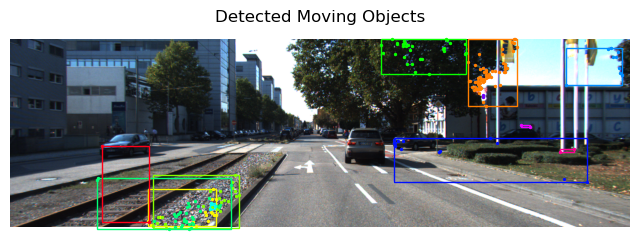

Image Pair #18:


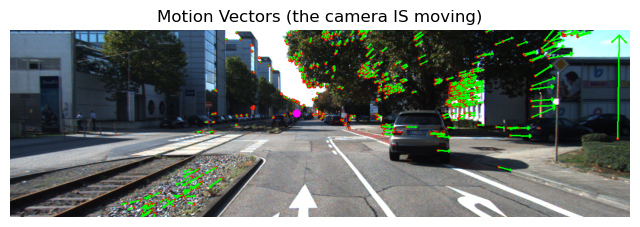

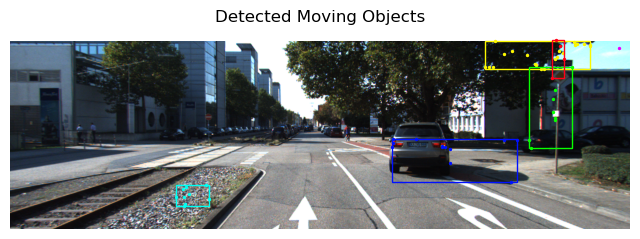

Image Pair #19:


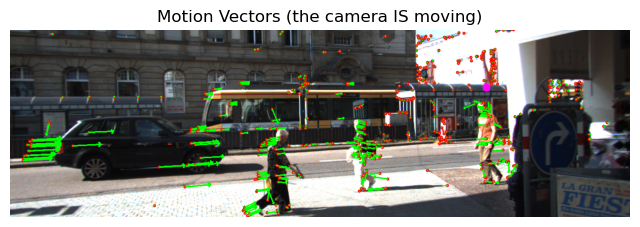

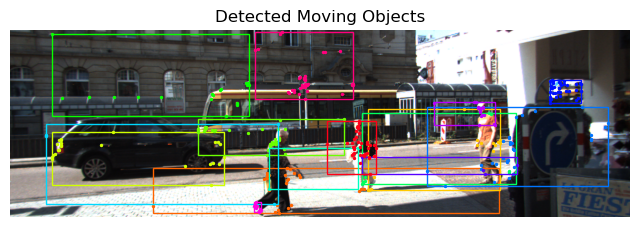

Image Pair #20:


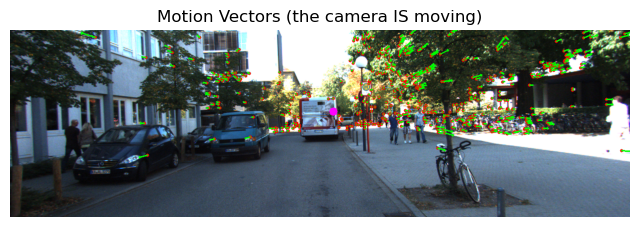

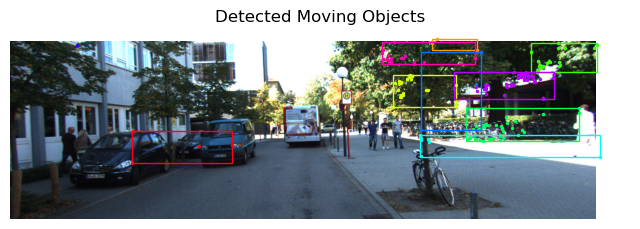

Image Pair #21:


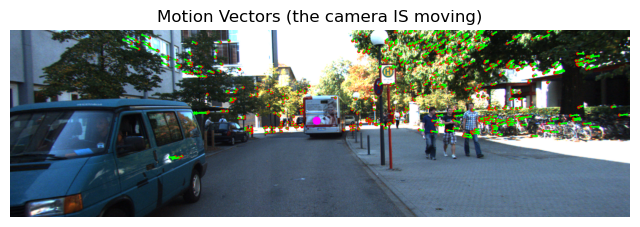

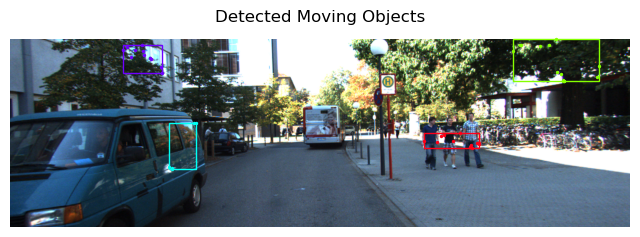

Image Pair #22:


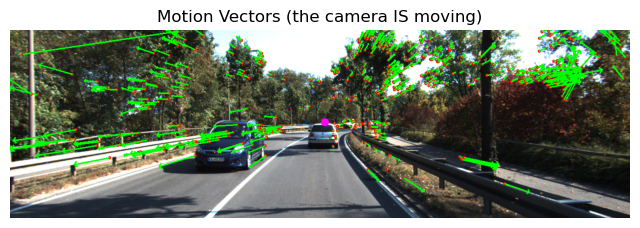

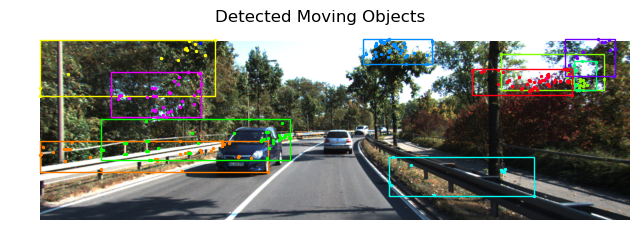

Image Pair #23:


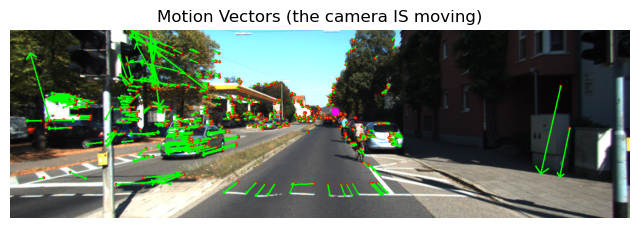

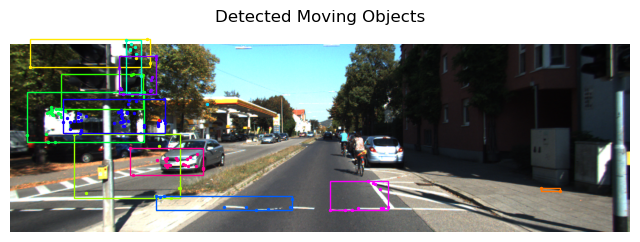

Image Pair #24:


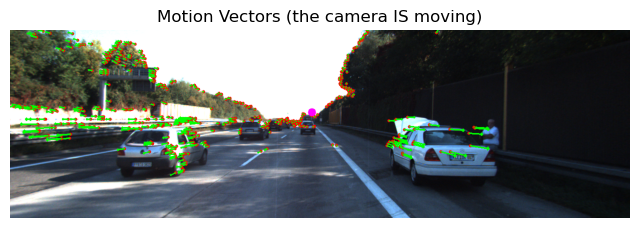

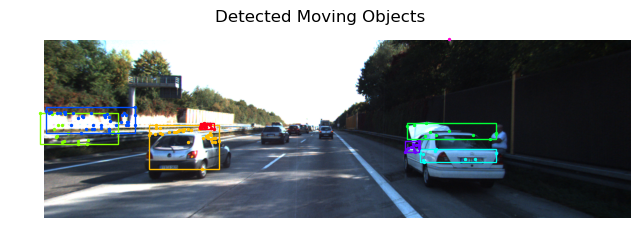

Image Pair #25:


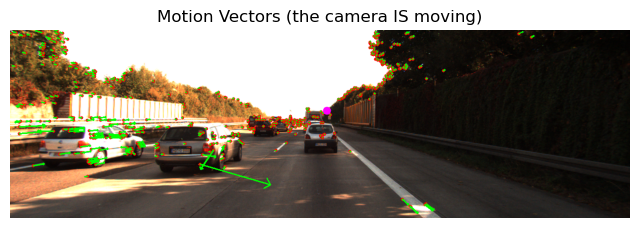

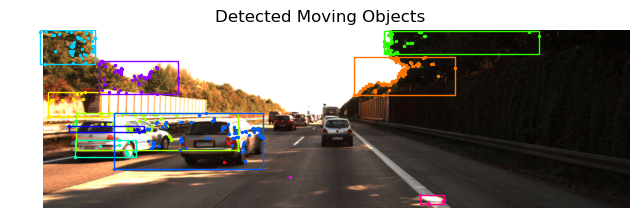

In [353]:
# Draw the output images
for pair_idx in range(len(image_pairs)):
    kps_i = paired_keypoints[pair_idx][0].astype(np.int32)
    kps_j = paired_keypoints[pair_idx][1].astype(np.int32)
    FOE_pt = FOE_pts[pair_idx]
    image = color_image_pairs[pair_idx][1]

    print(f"Image Pair #{pair_idx+1}:")
    draw_motion_vec_and_foe(image.copy(), pair_idx, kps_i, kps_j)
    draw_clusters(image.copy(), object_labels[pair_idx], kps_j)

# Writeup

## Description of Camera Motion Estimation Algorithm
My algorithm determines wether or not the camera is moving in each image comparing the percentage of motion vectors that are aligned with FOE estimations with a threshold value. First, the angles between the direction from FOE and motion vectors are calculated. An angle is considered aligned if they are within 30 degrees of FOE direction. This algorithm seemly works well and it seems to accurately detect image pairs where the car is not moving. (See image pairs 3, 14 & 15 as examples)

## Description Independently Moving Object Detection
My method for detecting independently moving objects, works by using sklearn's AgglomerativeClustering algorithm. First, for each image, the starting keypoint, is bundled together with its corresponding vector, then normalized. This is then what is passed into the clustering algorithm which outputs labels. Next, these labels are then further filtered, reassigned to 0 if the absolute difference in average magnitude of that cluster and the median of the image falls below a threshold.


### Tradeoffs, Strengths and Weaknesses
A strength of the object detection is that most clusters seem logical. In addition, moving objects such as cars are almost always accurately detected. 

A weakness of this method is that it only takes into account magnitude of vectors and not direction. An independently moving object could be moving in the opposite direction but with the same magnitude and it would not be detected. I tried to implement a composite measure that included direction but ran into trouble.

Another weakness is that background objects such as trees are frequently misclassified as independently moving objects. (See image pair 16 & 9 as an example)

In addition, sometimes strange clustering decisions are made. This can involve large bounding boxes for very sparse points that don't clearly define any object. (See image pairs 2 & 4 & 25 as an example)


